# DS620- Abrar Radiin G220054885
## Module10 CT-Geographical data visualization in Python 

### Table of Contents

Use the following Coronavirus Lat/Long dataset (available at Kaggle.com). It contains an outlook on the data science job market in the U.S. in 2018 August. Create a Jupyter notebook file that includes Python code to do the following:

1- Read the data.

2- Explore the dataset, make sure there are no missing values, and if there are, they are filled with 0s.

3- Convert data in each column into an appropriate data type.

4- Create interactive visualizations that show the location of each geographical column (latitude and longitude).

5- Group the data as you see appropriate.

6- Choose and visualize the data using the appropriate chart.

7- At the end of the file summarize the results of your statistical and visual analysis.

In [53]:
import numpy as np # linear algebra
import pandas as pd # data processing
from shapely.geometry import Point
import geopandas as gd
from geopandas import GeoDataFrame
import matplotlib.pyplot as plt

#### 1&2 
- Read the data.
- Explore the dataset, make sure there are no missing values, and if there are, they are filled with 0s.


In [54]:
df = pd.read_csv("/Users/abrar/Desktop/alldata copy.csv")
df.head()

,position,company,description,reviews,location,lat,long
0,Development Director,ALS TDI,Development Director\nALS Therapy Development ...,NaN,Atlanta,33.7569,-84.3903
1,An Ostentatiously-Excitable Principal Research...,The Hexagon Lavish,"Job Description\n\n""The road that leads to acc...",NaN,Atlanta,33.7569,-84.3903
2,Data Scientist,Xpert Staffing,"Growing company located in the Atlanta, GA are...",NaN,Atlanta,33.7569,-84.3903
3,Data Analyst,Operation HOPE,DEPARTMENT: Program OperationsPOSITION LOCATIO...,44.0,Atlanta,33.7569,-84.3903
4,Assistant Professor -TT - Signal Processing & ...,Emory University,DESCRIPTION\nThe Emory University Department o...,550.0,Atlanta,33.7569,-84.3903


In [55]:
df.shape

(6953, 7)

In [56]:
df.isnull().sum()

position          0
company           0
description       0
reviews        1627
location          0
lat               0
long              0
dtype: int64

In [57]:
df.fillna(0, inplace = True)

In [58]:
df.isnull().sum()

position       0
company        0
description    0
reviews        0
location       0
lat            0
long           0
dtype: int64

#### 3 Convert data in each column into an appropriate data type.

In [59]:
# Get more info about dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6953 entries, 0 to 6952
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   position     6953 non-null   object 
 1   company      6953 non-null   object 
 2   description  6953 non-null   object 
 3   reviews      6953 non-null   float64
 4   location     6953 non-null   object 
 5   lat          6953 non-null   float64
 6   long         6953 non-null   float64
dtypes: float64(3), object(4)
memory usage: 380.4+ KB


In the previous section we read the dataset and it contains about 7 columns and 6953 rows. There were 1627 missing values in the reviews column, and we replaced it with 0. Also, we checked the type of data and it shows that it is an appreciated type and does not need to convert any data type.



#### 4 Create interactive visualizations that show the location of each geographical column (latitude and longitude).

In [60]:

import folium

In [61]:


# Create a map centered at a specific location (you can adjust this)
m = folium.Map(location=[37.0902, -95.7129], zoom_start=4)

# Add markers to the map for each location
for index, row in df.iterrows():
    folium.Marker(
        location=[row['lat'], row['long']],
        popup=f"{row['position']} at {row['company']}"
    ).add_to(m)


# Display the map
m

 This code snippet creates a map and adds markers for each location, displaying the position and company as pop-up information when clicked.

#### 5&6
- Group the data as you see appropriate.
- Choose and visualize the data using the appropriate chart.

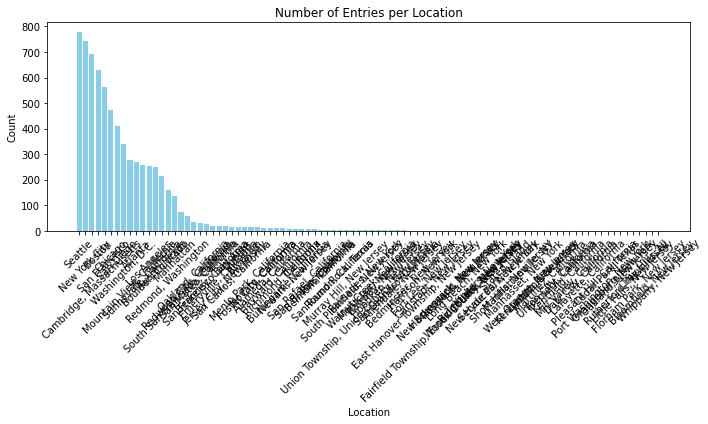

In [62]:
# Grouping the data by 'location' and counting occurrences
location_counts = df['location'].value_counts().reset_index()
location_counts.columns = ['Location', 'Count']

# Sorting by count in descending order
location_counts = location_counts.sort_values(by='Count', ascending=False)

# Creating a bar plot
plt.figure(figsize=(10, 6))
plt.bar(location_counts['Location'], location_counts['Count'], color='skyblue')
plt.xlabel('Location')
plt.ylabel('Count')
plt.title('Number of Entries per Location')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

This code snippet counts the number of entries per location and creates a bar plot showing the count for each location. But as we have many location I decided to find the top 10 location as follow 

In [63]:
# Get the top 10 locations based on occurrences
top_10_locations = df['location'].value_counts().head(10)
print("Top 10 Locations based on Occurrences:")
print(top_10_locations)

Top 10 Locations based on Occurrences:
Seattle                      777
New York City                743
Cambridge, Massachusetts     694
Boston                       629
San Francisco                564
Chicago                      471
San Diego                    412
Washington, D.C.             340
Mountain View, California    277
Atlanta                      269
Name: location, dtype: int64


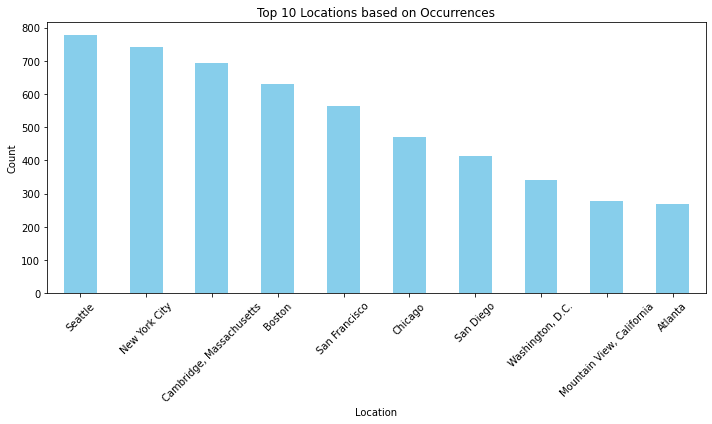

In [64]:
# Create a bar plot for the top 10 locations
plt.figure(figsize=(10, 6))
top_10_locations.plot(kind='bar', color='skyblue')
plt.xlabel('Location')
plt.ylabel('Count')
plt.title('Top 10 Locations based on Occurrences')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


This code snippet uses value_counts() on the 'location' column to count the occurrences of each location and then retrieves the top 10 locations then I generate a bar plot showing the top 10 locations based on their occurrence counts in the dataset.
- we can infer that Seattle has the most occurrences, which means it has around 777 positions in the field of data science. 
 

In [65]:
# Grouping data by 'company' and counting occurrences
company_counts = df['company'].value_counts().reset_index()
company_counts.columns = ['Company', 'Count']

company_counts 

,Company,Count
0,Amazon.com,358
1,Ball Aerospace,187
2,Microsoft,137
3,Google,134
4,NYU Langone Health,77
...,...,...
2208,Milacron LLC,1
2209,FabFitFun,1
2210,Greenlots,1
2211,Science 37,1


grouped the data by the 'company' column and counted the occurrences of each company in your DataFrame.

In [66]:
# Create a map centered at a specific location (you can adjust this)
m = folium.Map(location=[37.0902, -95.7129], zoom_start=4)
# Add markers to the map for each company location
for index, row in df.iterrows():
    # Find the corresponding count for the company
    company = row['company']
    count = company_counts.loc[company_counts['Company'] == company, 'Count'].values[0]

    folium.Marker(
        location=[row['lat'], row['long']],
        popup=f"{row['position']} at {company}<br>Occurrences: {count}"
    ).add_to(m)

# Display the map
m

This code snippet adds markers to the map for each location, and when clicked, it displays the position, company name, and the count of occurrences for that company

Top 10 Companies based on Occurrences:
                                  Company  Count
0                              Amazon.com    358
1                          Ball Aerospace    187
2                               Microsoft    137
3                                  Google    134
4                      NYU Langone Health     77
5  Fred Hutchinson Cancer Research Center     70
6                                    KPMG     66
7                                  Lab126     50
8                                Facebook     49
9                         Broad Institute     49


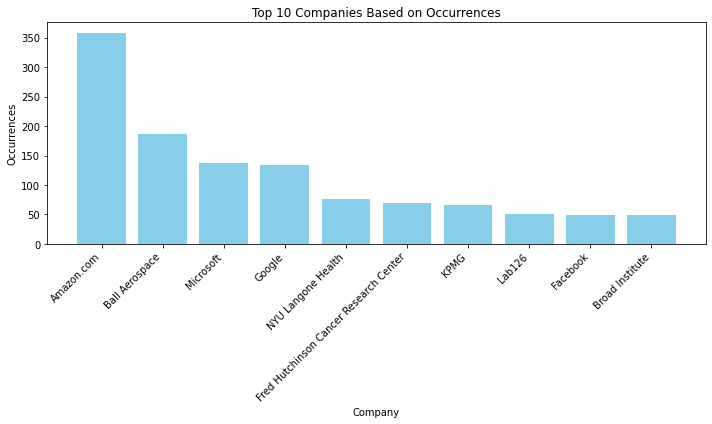

In [67]:
# Get top 10 companies
top_10_companies = company_counts.head(10)

# Print the top 10 companies based on occurrences
print("Top 10 Companies based on Occurrences:")
print(top_10_companies)

# Creating a bar plot to visualize the top 10 companies
plt.figure(figsize=(10, 6))
plt.bar(top_10_companies['Company'], top_10_companies['Count'], color='skyblue')
plt.xlabel('Company')
plt.ylabel('Occurrences')
plt.title('Top 10 Companies Based on Occurrences')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Show the plot
plt.show()

In the previous snippet we extracted the top 10 companies based on their occurrences from the company_counts DataFrame and created a bar plot to visualize this information. 
- We can infer that Amazon has the most occurrences, that means Amazon has around 358 positions for jobs in the field of Data science.


In [68]:
# Grouping data by 'company' and 'reviews', and resetting the index for sorting
grouped_data = df.groupby('company')['reviews'].max().reset_index()

# Sorting the grouped data by 'reviews' in descending order
sorted_data = grouped_data.sort_values(by='reviews', ascending=False)

print(sorted_data)

                                                company   reviews
2100                                            Walmart  148114.0
1925                                     The Home Depot   38844.0
1858                                             TARGET   33275.0
47                                                 AT&T   30064.0
2112                                        Wells Fargo   27992.0
...                                                 ...       ...
1039                                           Intellia       0.0
1035                                           Insurify       0.0
1032  Institute for Health Metrics and Evaluation - ...       0.0
1030                                     Insticator Inc       0.0
2212                                                 쿠팡       0.0

[2213 rows x 2 columns]


Grouped the data by the 'company' column and retrieved the maximum value of 'reviews' for each company, then sorted this data in descending order based on the 'reviews' column.

Top 10 Companies based on Reviews:
                                    company   reviews
2100                                Walmart  148114.0
1925                         The Home Depot   38844.0
1858                                 TARGET   33275.0
47                                     AT&T   30064.0
2112                            Wells Fargo   27992.0
621                  Department of the Navy   25909.0
122                              Amazon.com   25907.0
1219                                 Macy's   25765.0
1814                              Starbucks   24869.0
1725  Sears Holdings Management Corporation   24188.0


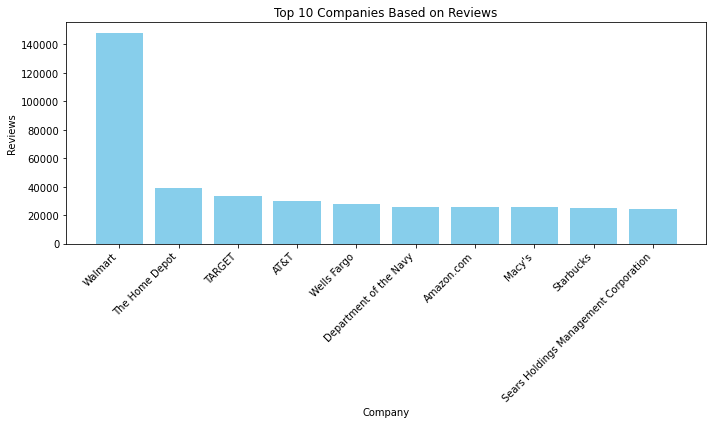

In [69]:
# Sorting the grouped data by 'reviews' in descending order and selecting the top 10
top_10_companies = grouped_data.nlargest(10, 'reviews')

# Print the top 10 companies based on highest reviews
print("Top 10 Companies based on Reviews:")
print(top_10_companies)

# Creating a bar plot to visualize the top 10 companies
plt.figure(figsize=(10, 6))
plt.bar(top_10_companies['company'], top_10_companies['reviews'], color='skyblue')
plt.xlabel('Company')
plt.ylabel('Reviews')
plt.title('Top 10 Companies Based on Reviews')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Show the plot
plt.show()

In [70]:
# Grouping data by 'position' and 'location' and counting occurrences
position_counts = df.groupby(['position', 'location']).size().reset_index(name='Count')

# Get top 10 positions based on occurrence
top_10_positions = position_counts.nlargest(10, 'Count')

# Print the DataFrame containing the top 10 positions and their respective locations
print(top_10_positions)

                   position          location  Count
1189         Data Scientist     New York City     88
1198         Data Scientist     San Francisco     52
1183         Data Scientist           Chicago     26
1178         Data Scientist            Boston     25
4440  Senior Data Scientist     San Francisco     22
1209         Data Scientist  Washington, D.C.     21
1175         Data Scientist           Atlanta     18
3579       Research Analyst     New York City     16
4436  Senior Data Scientist     New York City     16
1186         Data Scientist       Los Angeles     14


Grouped the data by both 'position' and 'location', counted the occurrences, and then extracted the top 10 positions based on their occurrences in the DataFrame.
- We can infer that Data Scientist is the most common position in different locations. 


In [71]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

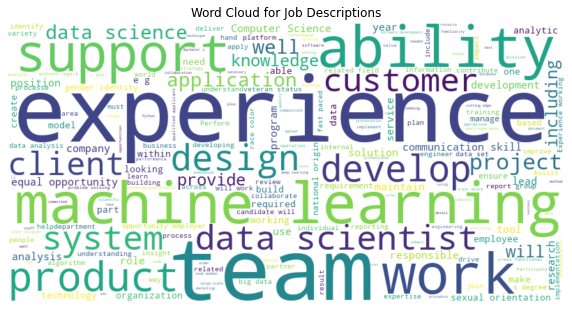

In [72]:
# Combine all descriptions into a single string
text = " ".join(desc for desc in df['description'])

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, max_words=200, background_color='white').generate(text)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Job Descriptions')
plt.show()

- From word clouds we can see the most common words ( experience, team, ,machine learning) so we might infer that the common jobs are in the field if machine learning and experience is needed in the job. 

#### 7 In brief : 

    - when grouping the data by location we inferred that  Seattle has the most occurrences, which means it has around 777 positions in the field of data science.
    
    - when grouping the data by company we inferred that Amazon has the most occurrences, that means Amazon has around 358 positions for jobs in the field of Data science.
    
    - when grouping the data by reviews we inferred that Walmart gets more reviews compared to other companies.
    
    - when grouping the data by position we inferred that Data Scientist is the most common position in 
    different locations.

    

References: 

- Nathan, P. (2020, June 2). Visualizing Geospatial Data in python. Medium. https://towardsdatascience.com/visualizing-geospatial-data-in-python-e070374fe621 

- GeeksforGeeks. (2022, November 28). Visualizing Geospatial Data using Folium in python. GeeksforGeeks. https://www.geeksforgeeks.org/visualizing-geospatial-data-using-folium-in-python/ 

